<style type='text/css'> body {background-image: url('sfondo_slides.png') !important;} </style>
# LAB4
                    Project done by Michela Pirozzi MAT:732531 and Sara Ferioli MAT:733105

## Goal
* Given the features in the dataset, what is the best combination to have a new contract? Was the feature combination the same even before covid?

* Predict number of contracts. Is the number of contracts predicted for the future in 2019 the same or similar to the actual data given the occurrence of COVID? 

## Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from math import sqrt
from sklearn import preprocessing
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import accuracy_score
from sklearn.model_selection import ParameterGrid, GridSearchCV
from sklearn.metrics import make_scorer
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import plot_tree 
import warnings
warnings.filterwarnings('ignore')

## Functions

In [2]:
# Method that allow to extract only specific (time) years
# syntax:
# df: dataframe
# time: regex. es: r'20(18|19|20|21)' or r'2020'
def set_years(df,time):
    df.replace(r'..(/|-)..(/|-)','',regex=True, inplace = True)
    df = df[df["DATA"].str.match(time)==True]
    return df

In [3]:
# Method that allow to extract only specific (time) mouths, modify the data order: yyyy/mm
# syntax:
# df: dataframe
# time: regex. es: r'20(18|19|20|21)' or r'2020'
def set_mouths(df,time):
    df.DATA.replace(r'..(/|-)(..)(/|-)(....)' , r'\4\3\2', regex=True,inplace=True,)
    df = df[df["DATA"].str.match(time)==True]
    return df

In [4]:
# Method that creates an animated histogram
# syntax:
# df: dataframe
# column: column on which you want to group
# time: column on which you want to animate
def time_for_column(df, column, time):
    df_merge_col = df.groupby([column, time]).size().sort_values(ascending=False).reset_index(name='count')
    tot = px.bar(df_merge_col, x=column, y='count', animation_frame=time,
                 animation_group=column, color=column)
    tot.update_layout(title='')
    tot.update_xaxes(categoryorder='total ascending')
    tot.show()

In [5]:
# Method for creating a geographic map.
# syntaxt:
# df: dataframe
# column: column on which you want to group
def map_fig(df,column):
    df_merge_col = df.groupby([column, "latitudine","longitudine"]).size().reset_index(name='count')
    df_merge_col['count']=df_merge_col['count']/100
    df_merge_col['count']=list(map(int, df_merge_col['count']))
    fig = px.scatter_mapbox(df_merge_col, lat="latitudine", lon="longitudine", color=column,
                      size="count", zoom=18)
    fig.update_layout(mapbox_style="open-street-map")
    fig.show()

In [6]:
# Method for creating a line graph with two lines.
# syntaxt:
# df1: dataframe
# df2: dataframe
# column: elements of x-axis
# name1: name of the first line
# name2: name of the second line
def line_fig(df1,df2,column,name1,name2):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df1[column], y=df1["count"],
                        mode='lines',
                        name=name1))
    fig.add_trace(go.Scatter(x=df2[column], y=df2["count"],
                        mode='lines',
                        name=name2))
    fig.update_xaxes(categoryorder='category ascending')

    # lockdown period
    fig.add_vline(x='2020/03', line_width=3, line_dash="dash", line_color="green")
    fig.add_vline(x='2020/09', line_width=3, line_dash="dash", line_color="green")

    fig.show()

In [7]:
# Function that return the maximum and minimum value and the their indexes (in this case the type of sector)
# syntax:
# data: dataframe on which retrieve values
def find_maxmin(data):
    grouped = data.groupby(["SETTOREECONOMICODETTAGLIO", "DATA"]).size().sort_values(ascending=False)
    max_val = grouped.max()
    idmax = grouped.idxmax()
    min_val= grouped.min()
    idmin = grouped.idxmin()

    return max_val, idmax[0], min_val, idmin[0]

In [8]:
# Method that allow to load ateco csv and prepare the data for the join
def addingAteco():
    df_ateco = pd.read_csv("ateco.csv")
    df_ateco.Descrizione_ateco.replace(r'^.* - ' , '',regex=True, inplace = True,)
    df_ateco = df_ateco.drop("_id",axis=1)
    df_ateco.rename(columns = {"Descrizione_ateco":"SETTOREECONOMICODETTAGLIO"}, inplace = True)
    df_ateco['SETTOREECONOMICODETTAGLIO'] = df_ateco['SETTOREECONOMICODETTAGLIO'].str.upper()
    df_ateco.drop_duplicates(subset="SETTOREECONOMICODETTAGLIO",keep="first",inplace=True)
    return df_ateco

In [9]:
# Commento
def find_best_max_depth(X_train,y_train,X_test,y_test):
    # Find the max depth neccessary for the Decision tree
    max_depth = []
    acc_gini = []
    acc_entropy = []
    for i in range(1,30):
         dtree = DecisionTreeClassifier(criterion='gini', max_depth=i)
         dtree.fit(X_train, y_train)
         pred = dtree.predict(X_test)
         acc_gini.append(accuracy_score(y_test, pred))
         ####
         dtree = DecisionTreeClassifier(criterion='entropy', max_depth=i)
         dtree.fit(X_train, y_train)
         pred = dtree.predict(X_test)
         acc_entropy.append(accuracy_score(y_test, pred))
         ####
         max_depth.append(i)
    d = pd.DataFrame({'acc_gini':pd.Series(acc_gini), 
     'acc_entropy':pd.Series(acc_entropy),
     'max_depth':pd.Series(max_depth)})
    # visualizing changes in parameters
    plt.plot('max_depth','acc_gini', data=d, label='gini')
    plt.plot('max_depth','acc_entropy', data=d, label='entropy')
    plt.xlabel('max_depth')
    plt.ylabel('accuracy')
    plt.legend()

In [10]:
# Method that allow to scaled the features
# syntax:
# data_train: train dataframe
# data_test: test dataframe
def scaleFeaturesDF(data_train, data_test):

    transf = preprocessing.MinMaxScaler().fit(data_train)
    data_train = transf.transform(data_train)
    data_train = pd.DataFrame(data_train)
    data_test = transf.transform(data_test)
    data_test = pd.DataFrame(data_test)
    
    
    return data_train, data_test

## Import data

In [11]:
# Load dataset
attivati = pd.read_csv("Rapporti_di_lavoro_attivati.csv")
attivati.head()

,DATA,GENERE,ETA,SETTOREECONOMICODETTAGLIO,TITOLOSTUDIO,CONTRATTO,MODALITALAVORO,PROVINCIAIMPRESA,ITALIANO
0,09/05/2020,F,60,Attività di famiglie e convivenze come datori ...,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO,TEMPO PIENO,BERGAMO,UCRAINA
1,12/07/2019,M,43,"Gestioni di funicolari, ski-lift e seggiovie s...",LICENZA MEDIA,LAVORO A TEMPO DETERMINATO,TEMPO PIENO,BERGAMO,ITALIA
2,05/06/2013,F,20,Fabbricazione di altre apparecchiature elettri...,LICENZA MEDIA,APPRENDISTATO PROFESSIONALIZZANTE O CONTRATTO ...,TEMPO PIENO,BERGAMO,ITALIA
3,12/03/2010,F,28,Alberghi,DIPLOMA DI ISTRUZIONE SECONDARIA SUPERIORE CH...,LAVORO INTERMITTENTE A TEMPO DETERMINATO,NON DEFINITO,BERGAMO,ITALIA
4,06/04/2021,F,49,Rifugi di montagna,LICENZA MEDIA,LAVORO INTERMITTENTE,NON DEFINITO,BERGAMO,ITALIA


## Data analysis

In [12]:
# Extract only the columns that are needed
dati = attivati[["DATA","CONTRATTO"]]
# I only consider the years of the covid and the previous ones
dati=set_years(dati,r'20(18|19|20|21)')
# I consider only the most frequent contracts
df_merge_col = dati.groupby(["CONTRATTO"]).size().sort_values(ascending=False).reset_index(name='count')
df_merge_col = df_merge_col[df_merge_col["count"]>10000]
dati=dati[dati["CONTRATTO"].isin(df_merge_col["CONTRATTO"])]

### Title

In [13]:
# Show the graph
time_for_column(dati,"CONTRATTO","DATA")

### Which sectors are most affected by covid?

In [14]:
# Extract from the dataset, only the columns of interest
dati = attivati[["DATA", "SETTOREECONOMICODETTAGLIO"]]
# I only consider the years of the covid and the previous ones
dati=set_years(dati,r'20(18|19|20|21)')
''' There are some null rows, and we decided to delete them because they are few compared to the dataset and do not compromise 
the result and also deducing their value would cost too much in comparison with the quality of information we could obtain. '''
dati = dati.dropna(axis=0)
# Consider only economic sectors with a certain frequency within the dataset 
df_merge_col = dati.groupby(["SETTOREECONOMICODETTAGLIO"]).size().sort_values(ascending=False).reset_index(name='count')
df_merge_col = df_merge_col[df_merge_col["count"]>40000]
dati1=dati[dati["SETTOREECONOMICODETTAGLIO"].isin(df_merge_col["SETTOREECONOMICODETTAGLIO"])]
df_merge_col = dati1.groupby(["SETTOREECONOMICODETTAGLIO", "DATA"]).size().sort_values(ascending=False).reset_index(name='count')

In [15]:
# Show the graph
px.bar(df_merge_col, 'SETTOREECONOMICODETTAGLIO', 'count', 
       color='SETTOREECONOMICODETTAGLIO', animation_frame='DATA',
       category_orders={'DATA':['2018', '2019', '2020', '2021']}, title='', range_y=[0, 60000])

#### Results
We can see that housework ('Attività di famiglie e convivenze come datori di lavoro per personale domestico') during the covid has increased. Instead, hotel ('Alberghi') and catering ('Ristorazione con somministrazione') sector have decreased.

### Disposizione lavoro

In [16]:
# Extract only the columns that are needed
dati = attivati[['DATA', 'CONTRATTO', 'PROVINCIAIMPRESA']]
# I only consider the years before and after the covid
dati=set_years(dati,r'20(19|21)') # lo teniamo o no?
# I consider only the most frequent contracts
df_merge_col = dati.groupby(["CONTRATTO"]).size().sort_values(ascending=False).reset_index(name='count')
df_merge_col = df_merge_col[df_merge_col["count"]>10000]
dati=dati[dati["CONTRATTO"].isin(df_merge_col["CONTRATTO"])]


# latitude mapping
dati.loc[dati['PROVINCIAIMPRESA']=='BERGAMO','latitudine']=45.6982642
dati.loc[dati['PROVINCIAIMPRESA']=='LECCO','latitudine']=45.8566
dati.loc[dati['PROVINCIAIMPRESA']=='BRESCIA','latitudine']=45.5257
dati.loc[dati['PROVINCIAIMPRESA']=='COMO','latitudine']=45.8109
dati.loc[dati['PROVINCIAIMPRESA']=='LODI','latitudine']=45.3145
dati.loc[dati['PROVINCIAIMPRESA']=='MANTOVA','latitudine']=45.153
dati.loc[dati['PROVINCIAIMPRESA']=='CREMONA','latitudine']=45.1371
dati.loc[dati['PROVINCIAIMPRESA']=='PAVIA','latitudine']=45.1854
dati.loc[dati['PROVINCIAIMPRESA']=='MILANO','latitudine']=45.4654219
dati.loc[dati['PROVINCIAIMPRESA']=='VARESE','latitudine']=45.83
dati.loc[dati['PROVINCIAIMPRESA']=='SONDRIO','latitudine']=46.1699
dati.loc[dati['PROVINCIAIMPRESA']=='MONZA E BRIANZA','latitudine']=45.5834


# longitude mapping
dati.loc[dati['PROVINCIAIMPRESA']=='BERGAMO','longitudine']=9.6772698
dati.loc[dati['PROVINCIAIMPRESA']=='LECCO','longitudine']=9.4039
dati.loc[dati['PROVINCIAIMPRESA']=='BRESCIA','longitudine']=10.2283
dati.loc[dati['PROVINCIAIMPRESA']=='COMO','longitudine']=9.0885
dati.loc[dati['PROVINCIAIMPRESA']=='LODI','longitudine']=9.5039
dati.loc[dati['PROVINCIAIMPRESA']=='MANTOVA','longitudine']=10.7748
dati.loc[dati['PROVINCIAIMPRESA']=='CREMONA','longitudine']=10.029
dati.loc[dati['PROVINCIAIMPRESA']=='PAVIA','longitudine']=9.1625
dati.loc[dati['PROVINCIAIMPRESA']=='MILANO','longitudine']=9.1859243
dati.loc[dati['PROVINCIAIMPRESA']=='VARESE','longitudine']=8.823
dati.loc[dati['PROVINCIAIMPRESA']=='SONDRIO','longitudine']=9.8702
dati.loc[dati['PROVINCIAIMPRESA']=='MONZA E BRIANZA','longitudine']=9.2759

In [17]:
# Show the graph
map_fig(dati,"CONTRATTO")

### How covid has affected the active contract according to age and gender?

In [18]:
# Extract only the columns that are needed
dati=attivati[["ETA","GENERE","DATA"]]

# I only consider the years before and after the covid
datibefore=set_years(dati,r'20(18|19)')
datiafter=set_years(dati,r'20(20|21)')

# Gender selection
femalebefore=datibefore[datibefore["GENERE"]=="F"]
malebefore=datibefore[datibefore["GENERE"]=="M"]
femaleafter=datiafter[datiafter["GENERE"]=="F"]
maleafter=datiafter[datiafter["GENERE"]=="M"]

# Create new dataframe depending on age and gender
femalebefore_merge_col = femalebefore.groupby(["ETA"]).size().reset_index(name='count')
femalebefore_merge_col=femalebefore_merge_col[["ETA","count"]]
malebefore_merge_col = malebefore.groupby(["ETA"]).size().reset_index(name='count')
malebefore_merge_col=malebefore_merge_col[["ETA","count"]]

femaleafter_merge_col = femaleafter.groupby(["ETA"]).size().reset_index(name='count')
femaleafter_merge_col=femaleafter_merge_col[["ETA","count"]]
maleafter_merge_col = maleafter.groupby(["ETA"]).size().reset_index(name='count')
maleafter_merge_col=maleafter_merge_col[["ETA","count"]]

In [19]:
# Show the graph
fig = go.Figure()
fig.add_trace(go.Scatter(x=femalebefore_merge_col["ETA"], y=femalebefore_merge_col["count"],
                    mode='lines',
                    name='female before'))
fig.add_trace(go.Scatter(x=malebefore_merge_col["ETA"], y=malebefore_merge_col["count"],
                    mode='lines',
                    name='male before'))
fig.add_trace(go.Scatter(x=femaleafter_merge_col["ETA"], y=femaleafter_merge_col["count"],
                    mode='lines',
                    name='female after'))
fig.add_trace(go.Scatter(x=maleafter_merge_col["ETA"], y=maleafter_merge_col["count"],
                    mode='lines',
                    name='male after'))

In [20]:
fig.show()

### Comparison between extended and terminated contract during covid.

In [21]:
# Load the dataset
prorogati = pd.read_csv("Rapporti_di_lavoro_prorogati.csv")
cessati = pd.read_csv("Rapporti_di_lavoro_cessati.csv")

# Extract only the columns that are needed
selectedprorogati = prorogati[["DATA", "PROVINCIAIMPRESA"]]
selectedcessati = cessati[["DATA", "PROVINCIAIMPRESA"]]

# I only consider the years of the covid
selectedprorogati=set_years(selectedprorogati,r'20(20|21)')
selectedprorogati['type']="prorogati"

# I only consider the years of the covid
selectedcessati=set_years(selectedcessati,r'20(20|21)')
selectedcessati['type']="cessati"

# Union of the two datasets
union=pd.concat([selectedprorogati,selectedcessati],axis = 0,ignore_index = True)

In [22]:
# lockdown period in green
prorogati=set_mouths(prorogati,r'20(18|19|20|21)')
cessati=set_mouths(cessati,r'20(18|19|20|21)')
prorogati_merge_col = prorogati.groupby(["DATA"]).size().sort_values(ascending=False).reset_index(name='count')
prorogati_merge_col=prorogati_merge_col.sort_values(by=['DATA']).reset_index()
cessati_merge_col = cessati.groupby(["DATA"]).size().sort_values(ascending=False).reset_index(name='count')
cessati_merge_col=cessati_merge_col.sort_values(by=['DATA']).reset_index()

In [23]:
# Show the graph
line_fig(prorogati_merge_col,cessati_merge_col,"DATA","prorogati","cessati")

### Which sectors have more or less active, extended or terminated constract, during covid?

In [24]:
# Extract only the columns that are needed
attivatisplit = attivati[["DATA", "SETTOREECONOMICODETTAGLIO", "ETA"]]

''' There are some null rows, and we decided to delete them because they are few compared to the dataset and do not compromise 
the result and also deducing their value would cost too much in comparison with the quality of information we could obtain. '''
attivatisplit = attivatisplit.dropna(axis=0)

# Select only the yers of interest
attivati20=set_years(attivatisplit,r'2020')

# Select only the yers of interest
attivati21=set_years(attivatisplit,r'2021')

# Min and Max values for the activated contracts in 2020
max_a20, idmax_a20, min_a20, idmin_a20 = find_maxmin(attivati20)

# Min and Max values for the activated contracts in 2021
max_a21, idmax_a21, min_a21, idmin_a21 = find_maxmin(attivati21)

In [25]:
print(f'The sector with the max number of activated contracts in 2020 is "{idmax_a20}" with {max_a20} contracts')
print(f'The sector with the min number of activated contracts in 2020 is "{idmin_a20}" with {min_a20} contracts')

print(f'The sector with the max number of activated contracts in 2021 is "{idmax_a21}" with {max_a21} contracts')
print(f'The sector with the min number of activated contracts in 2021 is "{idmin_a21}" with {min_a21} contracts')

The sector with the max number of activated contracts in 2020 is "Attività di famiglie e convivenze come datori di lavoro per personale domestico" with 49228 contracts
The sector with the min number of activated contracts in 2020 is "Trasporto mediante condotte di liquidi" with 1 contracts
The sector with the max number of activated contracts in 2021 is "Attività di produzione cinematografica, di video e di programmi televisivi" with 33020 contracts
The sector with the min number of activated contracts in 2021 is "Trasporto mediante condotte di liquidi" with 1 contracts


## Trasformazioni

### Adding Ateco

In [26]:
ateco = addingAteco()

# Transformations of the strings in upper case, to make join
attivati['SETTOREECONOMICODETTAGLIO'] = attivati['SETTOREECONOMICODETTAGLIO'].str.upper()

# Retrieve only the year from the date
attivati['DATA'] = pd.to_datetime(attivati['DATA'], format="%d/%m/%Y")
attivati['mese-anno'] = attivati['DATA'].apply(lambda x: x.strftime('%Y-%m'))
attivati ['ANNO'] = attivati.DATA.dt.year
attivati = attivati.drop(labels='DATA', axis=1)

# Join between the two DataFrames
join = pd.merge(attivati, ateco, on =['SETTOREECONOMICODETTAGLIO'], how='inner')

# Obtain only the first two digits of the 'codice ateco' to understand the macro category
join.Codice_ateco.replace(r'^(..)\..*' , r'\1',regex=True, inplace = True,)

# Extract macro category
join = pd.merge(join, ateco, on='Codice_ateco', how='inner')

# Delete the sub category
join = join.drop(labels='SETTOREECONOMICODETTAGLIO_x', axis=1)

# Transformations of the strings in upper case, to make a match, without problem
join['CONTRATTO']=join['CONTRATTO'].str.upper()

In [27]:
join.head()

,GENERE,ETA,TITOLOSTUDIO,CONTRATTO,MODALITALAVORO,PROVINCIAIMPRESA,ITALIANO,mese-anno,ANNO,Codice_ateco,SETTOREECONOMICODETTAGLIO_y
0,F,60,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO,TEMPO PIENO,BERGAMO,UCRAINA,2020-05,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...
1,F,33,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO A TEMPO DETERMINATO,TEMPO PARZIALE ORIZZONTALE,BERGAMO,HONDURAS,2012-07,2012,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...
2,F,45,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO,TEMPO PIENO,BERGAMO,ITALIA,2019-04,2019,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...
3,F,61,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO,TEMPO PIENO,LECCO,UCRAINA,2014-09,2014,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...
4,F,20,NESSUN TITOLO DI STUDIO,LAVORO DOMESTICO,TEMPO PARZIALE ORIZZONTALE,LECCO,ITALIA,2014-05,2014,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...


### Altre trasformazioni

In [28]:
# Set generic category for the contracts 
join.loc[join['CONTRATTO'].str.match(r'.*INDETERMINATO.*') == True,"CONTRATTO"]="INDETERMINATO"
join.loc[join['CONTRATTO'].str.match(r'.*INDETERMINATO.*') == False,"CONTRATTO"]="NON INDETERMINATO"

indeterminato=join.copy()

# Commento
africa=pd.DataFrame(["SENEGAL ","NIGERIA","MAROCCO","EGITTO","GUINEA","GHANA","Mauritius","ALGERIA","ETIOPIA","TUNISIA","COSTA D’AVORIO","CAMERUN","GUINEA EQUATORIALE","BENIN","MAURITANIA","ARGENTINA","TOGO","UGANDA","CONGO","NEPAL","ERITREA","Congo, Rep.Democratica","SIERRA LEONE","SOMALIA","GAMBIA","NIGER","KENYA","LIBIA","SEYCHELLES","SUD AFRICA","CAPO VERDE","BURUNDI","TANZANIA","GABON","ZIMBABWE","SUD SUDAN","GUINEA BISSAU","LIBERIA","ZAMBIA","ANGOLA","MADAGASCAR","SUDAN","RUANDA","Centrafricana, Repubblica","CIAD","MOZAMBICO","Sao Tomè e Principe","SWAZILAND","GUYANA","NAMIBIA"])
africa['merge']='AFRICA'
sudame=pd.DataFrame(["BOLIVIA ","ECUADOR ","PERU","COLOMBIA","BRASILE","VENEZUELA","PARAGUAY","CILE","MALI","URUGUAY","TRINIDAD E TOBAGO","SAINT LUCIA"])
sudame['merge']='SUD AMERICA'
centame=pd.DataFrame(["EL SALVADOR","Dominicana, Repubblica","CUBA","DOMINICA","BAHAMAS","HONDURAS","GUATEMALA","PANAMA","NICARAGUA","HAITI","BELIZE","ANTIGUA E BARBUDA","COSTA RICA","Saint Vincent e Grenadin"])
centame['merge']='CENTRO AMERICA'
asia=pd.DataFrame(["FILIPPINE","BANGLADESH","GEORGIA","PAKISTAN","INDIA","BURKINA FASO","KAZAKHSTAN","SIRIA","THAILANDIA","KIRGHIZISTAN","INDONESIA","AFGHANISTAN","AZERBAIGIAN","UZBEKISTAN","CAMBOGIA","MYANMAR","TAGIKISTAN","VIETNAM","ARMENIA","Corea, Repubblica Popolare","TUVALU","MONGOLIA","LAOS","MALAYSIA","TURKMENISTAN","VANUATU","PALAU","SINGAPORE","Corea, Repubblica","BHUTAN","Timor Orientale","TONGA","KIRIBATI","MALDIVE","BRUNEI","PAPUA NUOVA GUINEA","Micronesia, Stati Federati","NAURU","FIGI"])
asia['merge']='ASIA'
medioor=pd.DataFrame(["LIBANO","IRAN","ISRAELE","TURCHIA","YEMEN","BAHREIN","GIORDANIA","QATAR","IRAQ","Territori Autonomia Palestinese","ARABIA SAUDITA","OMAN","KUWAIT","EMIRATI ARABI UNITI","TERRITORI PALESTINESI"])
medioor['merge']='MEDIO ORIENTE'
singoli=pd.DataFrame(["TAIWAN" ,"Cinese, Repubblica Popolare","ROMANIA","Moldova","UCRAINA","SRI LANKA","APOLIDE","ITALIA","ALBANIA","RUSSA, Federazione","POLONIA","BOSNIA-ERZEGOVINA","UNGHERIA","GIAPPONE","MACEDONIA","ex REP. JUGOSLAVIA","CROAZIA","BULGARIA","SPAGNA","BIELORUSSIA","SERBIA E MONTENEGRO","FRANCIA","MONTENEGRO","LETTONIA","REGNO UNITO","AUSTRALIA","KOSOVO","LITUANIA","GERMANIA","ESTONIA","IRLANDA","MESSICO","PORTOGALLO","Marshall, Isole","DANIMARCA","GIAMAICA","STATI UNITI D’AMERICA","PAESI BASSI","CECA, Repubblica","BELGIO","SVIZZERA","SLOVENIA","CANADA","NORVEGIA","SLOVACCHIA","GRECIA","CIPRO","FINLANDIA","SVEZIA","MONACO","ANDORRA","MALTA","AUSTRIA","LUSSEMBURGO","ISLANDA","NUOVA ZELANDA","SAN MARINO"])
singoli=pd.concat([singoli,singoli], axis=1)
singoli.columns = [0,'merge']
naz=pd.concat([africa,sudame,centame,asia,medioor,singoli], ignore_index=True)
naz.columns = ['ITALIANO','merge']

# Commento
join =pd.merge(indeterminato, naz,on=['ITALIANO'],how='inner')

# Commento
join = join.drop(columns=["ITALIANO"])

# Commento
join.rename(columns={'merge':'ITALIANO'}, inplace=True)
indeterminato=join.copy()

In [29]:
indeterminato.head()

,GENERE,ETA,TITOLOSTUDIO,CONTRATTO,MODALITALAVORO,PROVINCIAIMPRESA,mese-anno,ANNO,Codice_ateco,SETTOREECONOMICODETTAGLIO_y,ITALIANO
0,F,60,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,BERGAMO,2020-05,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA
1,F,61,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,LECCO,2014-09,2014,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA
2,F,29,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,LECCO,2017-06,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA
3,F,48,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2017-08,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA
4,F,54,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2020-01,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA


### Label Encoder

In [30]:
# Starting the procedure to encode the data
titolostudio = indeterminato.TITOLOSTUDIO.tolist()
modlavoro = indeterminato.MODALITALAVORO.tolist()
prov = indeterminato.PROVINCIAIMPRESA.tolist()
nazionalita = indeterminato.ITALIANO.tolist()
copia = indeterminato.copy()

# Instantiate labelencoder object for each column that we want to encode
le_titolostudio = LabelEncoder()
le_modlavoro = LabelEncoder()
le_prov = LabelEncoder()
le_nazionalita = LabelEncoder()

# Apply the label encoder to the dataset
le_titolostudio.fit(copia['TITOLOSTUDIO'])
le_modlavoro.fit(copia['MODALITALAVORO'])
le_prov.fit(copia['PROVINCIAIMPRESA'])
le_nazionalita.fit(copia['ITALIANO'])

# Transform into integers
transformation_ts = le_titolostudio.transform(indeterminato['TITOLOSTUDIO']) 
transformation_ml = le_modlavoro.transform(indeterminato['MODALITALAVORO']) 
transformation_prov = le_prov.transform(indeterminato['PROVINCIAIMPRESA']) 
transformation_nazion = le_nazionalita.transform(indeterminato['ITALIANO']) 

# Apply label encoder on categorical feature columns
copia['titolostudio_transformed'] = list(transformation_ts)
copia['modalitalavoro_transformed'] = list(transformation_ml)
copia['provincia_transformed'] = list(transformation_prov)
copia['nazionalita_transformed'] = list(transformation_nazion)


In [31]:
copia.head()

,GENERE,ETA,TITOLOSTUDIO,CONTRATTO,MODALITALAVORO,PROVINCIAIMPRESA,mese-anno,ANNO,Codice_ateco,SETTOREECONOMICODETTAGLIO_y,ITALIANO,titolostudio_transformed,modalitalavoro_transformed,provincia_transformed,nazionalita_transformed
0,F,60,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,BERGAMO,2020-05,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,4,0,57
1,F,61,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,LECCO,2014-09,2014,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,4,4,57
2,F,29,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,LECCO,2017-06,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,4,57
3,F,48,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2017-08,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,1,57
4,F,54,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2020-01,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,1,57


### Encoding Manually Ordinal Categorical Features

In [32]:
# Create mapper
scale_mapper = {'NON INDETERMINATO':0, 'INDETERMINATO':1}

# Map feature values to scale
copia['contratto_transformed'] = copia['CONTRATTO'].replace(scale_mapper)

# Create mapper
scale_mapper = {'M':0, 'F':1}

# Map feature values to scale
copia['genere_transformed'] = copia['GENERE'].replace(scale_mapper)


In [33]:
copia.head()

,GENERE,ETA,TITOLOSTUDIO,CONTRATTO,MODALITALAVORO,PROVINCIAIMPRESA,mese-anno,ANNO,Codice_ateco,SETTOREECONOMICODETTAGLIO_y,ITALIANO,titolostudio_transformed,modalitalavoro_transformed,provincia_transformed,nazionalita_transformed,contratto_transformed,genere_transformed
0,F,60,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,BERGAMO,2020-05,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,4,0,57,0,1
1,F,61,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PIENO,LECCO,2014-09,2014,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,4,4,57,0,1
2,F,29,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,LECCO,2017-06,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,4,57,0,1
3,F,48,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2017-08,2017,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,1,57,0,1
4,F,54,NESSUN TITOLO DI STUDIO,NON INDETERMINATO,TEMPO PARZIALE ORIZZONTALE,BRESCIA,2020-01,2020,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,UCRAINA,8,2,1,57,0,1


### Remove outliers

In [34]:
# Trasform the column in int type
copia['Codice_ateco']=copia.Codice_ateco.astype(int)

# We remove the outliers. 
copia = copia[copia['ETA']>=15]
copia = copia[copia['ETA']<100]
copia = copia[copia['ANNO']<2022]
copia = copia[copia['ANNO']>2006]

# Drop the columns that have been transformed
transformed_indet = copia.drop(labels =['GENERE', 'TITOLOSTUDIO', 'MODALITALAVORO', 'PROVINCIAIMPRESA', 'ITALIANO', 'SETTOREECONOMICODETTAGLIO_y', 'CONTRATTO'], axis=1)

# Change the type of all column
transformed_indet['Codice_ateco'] = transformed_indet['Codice_ateco'].astype(str).astype(int)

transformed=transformed_indet.copy()

In [35]:
transformed.head()

,ETA,mese-anno,ANNO,Codice_ateco,titolostudio_transformed,modalitalavoro_transformed,provincia_transformed,nazionalita_transformed,contratto_transformed,genere_transformed
0,60,2020-05,2020,97,8,4,0,57,0,1
1,61,2014-09,2014,97,8,4,4,57,0,1
2,29,2017-06,2017,97,8,2,4,57,0,1
3,48,2017-08,2017,97,8,2,1,57,0,1
4,54,2020-01,2020,97,8,2,1,57,0,1


### Balancing
#### Random Undersampling

In [36]:
# Prima del Balancing
# Check if the dataset is balanced
transformed["contratto_transformed"].value_counts(normalize=True)

0    0.855403
1    0.144597
Name: contratto_transformed, dtype: float64

In [37]:
# Execute the undersampling for the NON INDETERMINATO's contracts
data_0 = transformed[transformed["contratto_transformed"]==0].sample(n=1300674,random_state=16) 
data_1 = transformed[transformed["contratto_transformed"]==1]
balanced = data_0.append(data_1)

In [38]:
# Check if the dataset is balanced
balanced["contratto_transformed"].value_counts(normalize=True)

0    0.5
1    0.5
Name: contratto_transformed, dtype: float64

## Prediction

### Given the features in the dataset, what is the best combination to have a new contract? Was the feature combination the same even before covid?

### Create the train and test sets

In [39]:
# Create the train and test sets
X = balanced[["ETA","ANNO","contratto_transformed","nazionalita_transformed","genere_transformed"]].values
y = pd.DataFrame(balanced['Codice_ateco'].copy()).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 7)

# To avoid the MemoryError, we change the dataset's type into a new lighter one
X_train=X_train.astype(np.uint8)
y_train=y_train.astype(np.uint8)

## Decision Tree

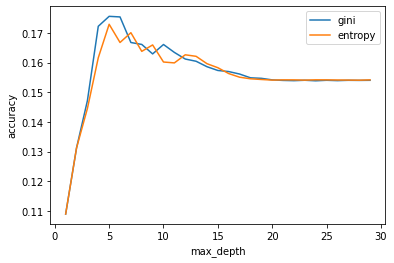

In [40]:
find_best_max_depth(X_train,y_train,X_test,y_test)

In [41]:
# Method that allow to calculate the decision tree
# syntax:
# X_train: input train dataframe
# y_train: output train dataframe
def dct(X_train, y_train):
    dct = tree.DecisionTreeClassifier()
    
    DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=7,
                           min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, 
                           random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, 
                           class_weight=None)
    
    return dct

In [ ]:
# Create Decision tree and fit it
dct = dct(X_train, y_train)
dct.fit(X_train, y_train)

[Text(0.4930217768449527, 0.984375, 'genere_transformed <= 0.5\ngini = 0.962\nsamples = 1820943\nvalue = [25035, 618, 240, 3, 43, 62, 544, 715, 30324, 1836\n2, 10962, 25037, 7466, 5295, 5401, 6768, 731, 16046\n7556, 23651, 5974, 11289, 72919, 8140, 12462, 34522\n6014, 2245, 6121, 5132, 11615, 3154, 554, 424, 4126\n884, 80332, 5953, 75454, 15082, 65481, 109046, 38656\n404, 1883, 61504, 6324, 58568, 164255, 4872, 55375\n5323, 3832, 35426, 6018, 12317, 2868, 4701, 6073\n11922, 5358, 6454, 3850, 26091, 9953, 109, 3739, 6713\n2750, 6458, 77961, 77976, 20327, 142072, 32392, 15441\n17277, 20039, 753, 3988, 19634, 12541, 1799, 36743\n84488, 458]'),
 Text(0.19740924412761662, 0.953125, 'contratto_transformed <= 0.5\ngini = 0.962\nsamples = 1023173\nvalue = [19459, 563, 110, 2, 21, 39, 478, 555, 16865, 1283\n2, 5837, 10733, 3763, 4492, 3880, 4591, 528, 8162\n3935, 15163, 4991, 9860, 58648, 5338, 8627, 27634\n4415, 1799, 4596, 2796, 9879, 2004, 402, 357, 3432\n717, 76477, 5486, 69906, 12285, 3876

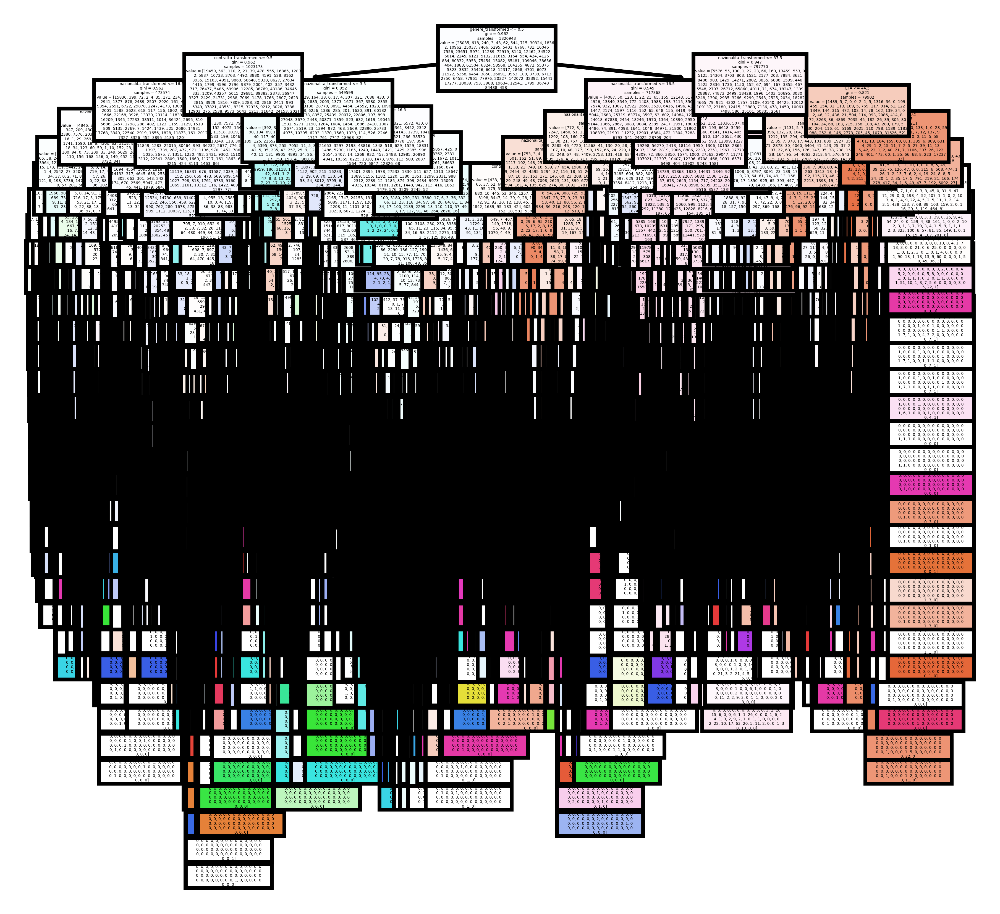

In [42]:
plt.figure(figsize=(4,4), dpi=1000)
plot_tree(dct,
         feature_names=["ETA","ANNO","contratto_transformed","nazionalita_transformed","genere_transformed"],
          filled=True,)

# Show Decision tree
plt.show()

In [44]:
# Probablistic prediction the values
y_pred_prob = dct.predict_proba(X_test)
print(y_pred_prob)

[[0.01872659 0.00374532 0.         ... 0.01123596 0.00374532 0.        ]
 [0.00722022 0.         0.         ... 0.00120337 0.         0.        ]
 [0.01372549 0.         0.         ... 0.01470588 0.00588235 0.        ]
 ...
 [0.00215517 0.         0.         ... 0.01508621 0.         0.        ]
 [0.00923788 0.         0.         ... 0.00923788 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [45]:
# Predict the values
y_pred = dct.predict(X_test)
print(y_pred)

[53 62 85 ... 85 41 41]


In [46]:
# Commento
r2_score(y_test, y_pred), mean_absolute_error(y_test, y_pred), np.sqrt(mean_squared_error(y_test, y_pred))

(-0.369856343458957, 21.282107367328503, 29.055119633810715)

#### Confusion matrix

In [47]:
# To avoid the MemoryError, we change the dataset's type into a new lighter one
y_test=y_test.astype(np.uint8)
y_pred=y_pred.astype(np.uint8)

In [48]:
# Print the confusion matrix
confusion = metrics.confusion_matrix(y_test, y_pred)
print(confusion)

[[ 944    0    0 ...   17  385    0]
 [   8    0    0 ...    0    0    0]
 [   2    0    2 ...    0    1    0]
 ...
 [  64    2    0 ... 2511  131    0]
 [ 593    0    1 ...  814 4935   12]
 [   5    0    0 ...    2   21    0]]


#### Best Depth Tree

In [ ]:
# Calculate the max depth in the decision tree
max_depth = dct.get_depth()

# Find the best parameter
max_depth_grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                                    scoring=make_scorer(accuracy_score),
                                    param_grid=ParameterGrid({"max_depth":[[max_depth] for max_depth in range(1, max_depth+1)]}),)
max_depth_grid_search.fit(X_train, y_train)

# Show the tree with the parameter found previuosly 
best_max_depth_tree=max_depth_grid_search.best_estimator_
best_max_depth = best_max_depth_tree.get_depth()

[Text(0.5047977858534393, 0.9615384615384616, 'genere_transformed <= 0.5\ngini = 0.962\nsamples = 1820943\nvalue = [25035, 618, 240, 3, 43, 62, 544, 715, 30324, 1836\n2, 10962, 25037, 7466, 5295, 5401, 6768, 731, 16046\n7556, 23651, 5974, 11289, 72919, 8140, 12462, 34522\n6014, 2245, 6121, 5132, 11615, 3154, 554, 424, 4126\n884, 80332, 5953, 75454, 15082, 65481, 109046, 38656\n404, 1883, 61504, 6324, 58568, 164255, 4872, 55375\n5323, 3832, 35426, 6018, 12317, 2868, 4701, 6073\n11922, 5358, 6454, 3850, 26091, 9953, 109, 3739, 6713\n2750, 6458, 77961, 77976, 20327, 142072, 32392, 15441\n17277, 20039, 753, 3988, 19634, 12541, 1799, 36743\n84488, 458]'),
 Text(0.24839634768844598, 0.8846153846153846, 'contratto_transformed <= 0.5\ngini = 0.962\nsamples = 1023173\nvalue = [19459, 563, 110, 2, 21, 39, 478, 555, 16865, 1283\n2, 5837, 10733, 3763, 4492, 3880, 4591, 528, 8162\n3935, 15163, 4991, 9860, 58648, 5338, 8627, 27634\n4415, 1799, 4596, 2796, 9879, 2004, 402, 357, 3432\n717, 76477, 5486

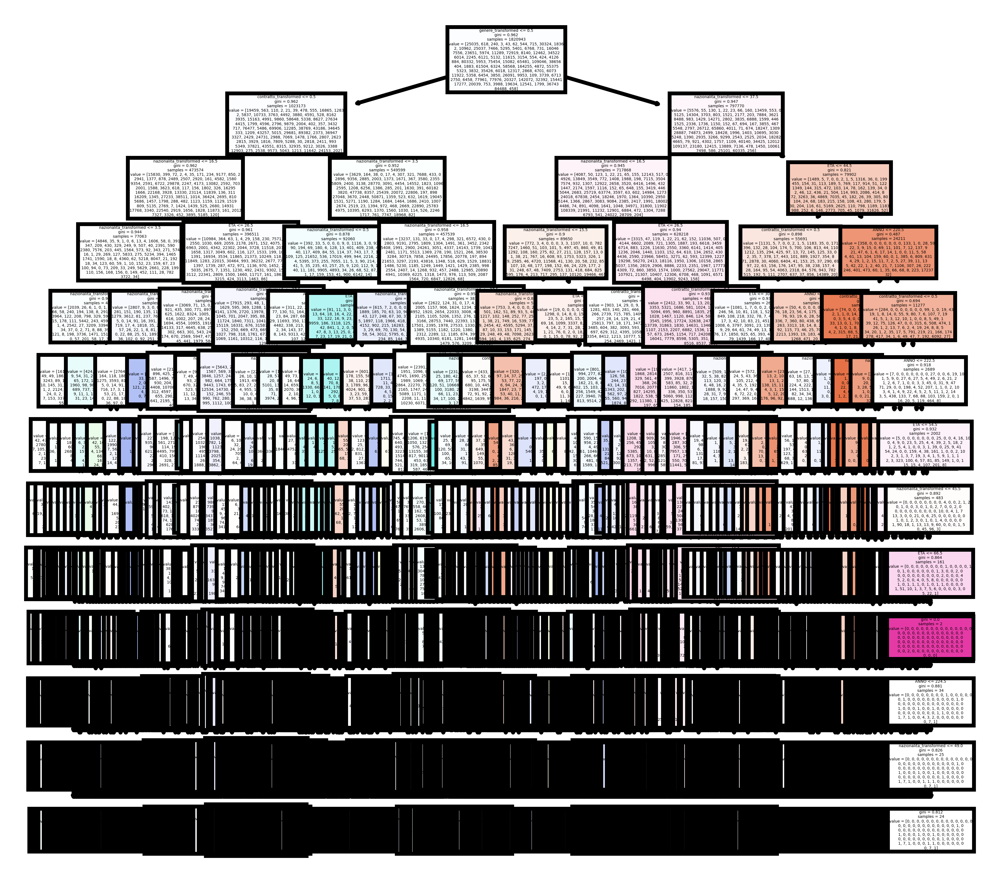

In [49]:
plt.figure(figsize=(4,4), dpi=1000)
plot_tree(best_max_depth_tree,
         feature_names=["ETA","ANNO","contratto_transformed","nazionalita_transformed","genere_transformed"],
          filled=True,)

plt.show()

In [50]:
# Show the best parameter
print(max_depth_grid_search.best_params_)

{'max_depth': 12}


## K-Nearest Neighbors Classification

In [51]:
# Apply the function 
[X_train, X_test]=scaleFeaturesDF(X_train, X_test)

# Find the model of K-Nearest Neighbors and fit it
knmodel = KNeighborsClassifier(n_neighbors =5, weights='uniform')
knmodel.fit(X_train, y_train)

# Predict using KNN
y_pred = knmodel.predict(X_train)
mse = mean_squared_error(y_train, y_pred)
rmse = sqrt(mse)

# To avoid the MemoryError, we change the dataset's type into a new lighter one
y_test=y_test.astype(np.uint8)
y_pred=y_pred.astype(np.uint8)

In [52]:
# Print the confusion matrix
confusion = metrics.confusion_matrix(y_train, y_pred)
print(confusion)

[[ 5320    24     8 ...    35   909     0]
 [   62    15     2 ...     0     5     0]
 [   12     0     8 ...     0     2     0]
 ...
 [  667     1     5 ...  3503   926     0]
 [ 2070     9     1 ...   344 50456     0]
 [   31     0     0 ...     3    54     0]]


## Future Prediction

### Predict number of contracts. Is the number of contracts predicted for the future in 2019 the same or similar to the actual data given the occurrence of COVID?

## ARIMA

In [40]:
# Load the dataset
balanced
bal1 = balanced.copy()
bal1 = bal1.reset_index(drop=True)

# Set mese-anno like index
bal2 = bal1.groupby("mese-anno").size().reset_index(name='count')
bal2 = bal2.set_index('mese-anno')

Text(0, 0.5, 'Number of Contracts')

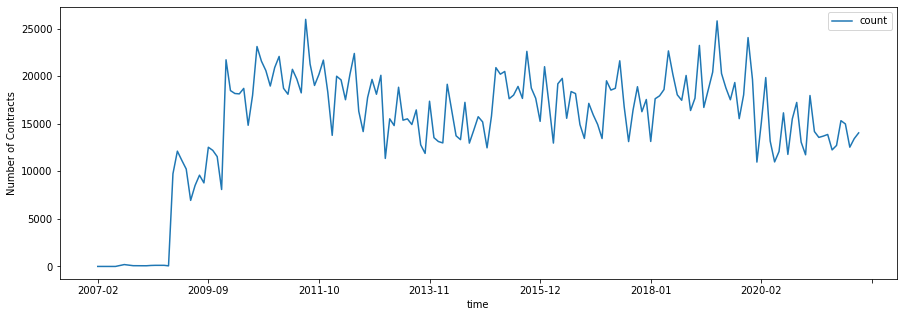

In [41]:
# Show count of contract for each mese-anno
f, ax1 = plt.subplots(1,1,figsize=(15,5))
bal2.plot(ax=ax1)
ax1.set_xlabel("time")
ax1.set_ylabel("Number of Contracts")

In [42]:
# Calculate the Augmented Dickey-Fuller test can be used to test for a unit root in a univariate 
#process in the presence of serial correlation.
results = adfuller(bal2['count'])

In [43]:
print('ADF Statistic: %f' % results[0])
print('p-value: %f' % results[1])

ADF Statistic: -4.613666
p-value: 0.000122


In [44]:
# Show seasonality and trend
plt.rcParams['figure.figsize'] = 20, 10
# Additive decomposition
decomposed_add = seasonal_decompose(bal2, model="additive", period=5)

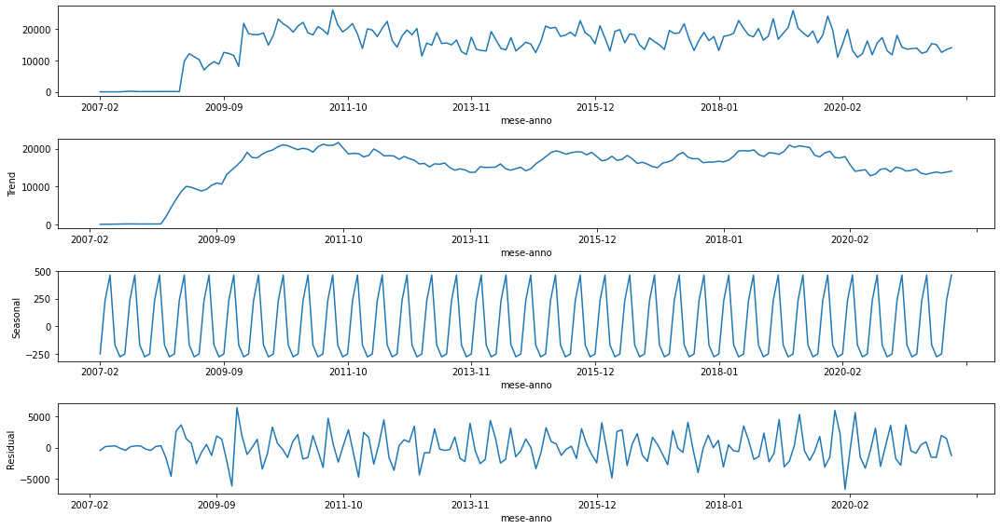

In [45]:
fig, ax = plt.subplots(4, 1, figsize=(15, 8))
# Plot the series
decomposed_add.observed.plot(ax = ax[0])
decomposed_add.trend.plot(ax = ax[1])
decomposed_add.seasonal.plot(ax = ax[2])
decomposed_add.resid.plot(ax = ax[3])
# Add the labels to the Y-axis
ax[0].set_ylabel('')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

plt.tight_layout()
plt.show()

In [46]:
# Calculate differential
bal_diff = bal2['count'].diff().dropna()

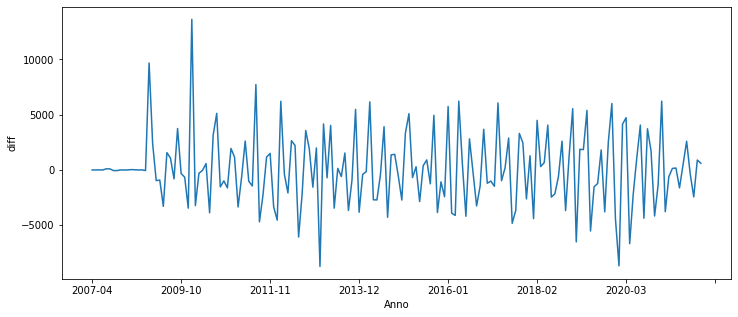

In [47]:
plt.figure(figsize=(12,5))
ax1 = bal_diff.plot()
ax1.set_xlabel("Anno")
ax1.set_ylabel("diff")
plt.show()

In [48]:
# Calculate the Augmented Dickey-Fuller test

results = adfuller(bal_diff)

In [49]:
print('ADF Statistic: %f' % results[0])
print('p-value: %f' % results[1])

ADF Statistic: -2.987232
p-value: 0.036104


In [50]:
# Calculate the Augmented Dickey-Fuller test
results = adfuller(bal2['count'].diff().diff().dropna())

In [51]:
print('ADF Statistic: %f' % results[0])
print("P-value of a test is: {}".format(results[1]))

ADF Statistic: -7.801078
P-value of a test is: 7.490497084597096e-12


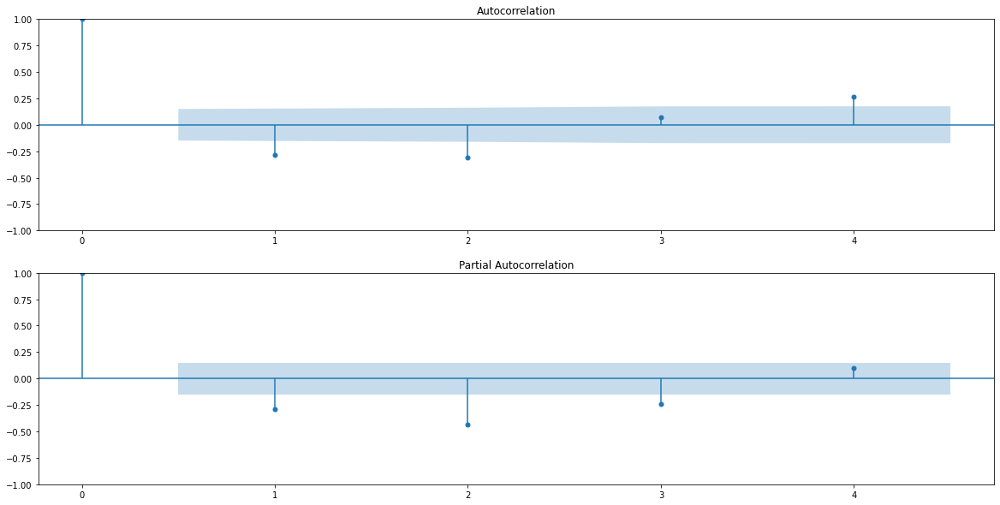

In [52]:
# Show autocorrelation and partial correlation
fig,ax = plt.subplots(2,1,figsize=(20,10))
plot_acf(bal_diff, lags=4, ax=ax[0])
plot_pacf(bal_diff, lags=4, ax=ax[1])
plt.show()

In [53]:
# Search p and q values

arima_df = pd.DataFrame(columns=["p","q","aic","bic"])

i=0
# Loop over p values from 0-5
for p in range(4):
    # Loop over q values from 0-5
    for q in range(4):
        
        try:
            # creating and fitting ARIMA(p,1,q) model
            model = ARIMA(bal2['count'].astype(float), order=(p,1,q))
            results = model.fit()
            
            # Printing order, AIC and BIC
            #print(p, q, results.aic, results.bic)
            arima_df.loc[i,"p"] = p
            arima_df.loc[i,"q"] = q
            arima_df.loc[i,"aic"] = results.aic
            arima_df.loc[i,"bic"] = results.bic
            i = i+1
        except:
            #print(p, q, None, None)
            i = i+1
    
arima_df["sum_aic_bic"] = arima_df["aic"]+arima_df["bic"]
arima_df.sort_values(by="aic", ascending=False, inplace=True)

In [54]:
arima_df.head()

,p,q,aic,bic,sum_aic_bic


In [55]:
# Compute the model
model2 = SARIMAX(bal2, order=(3,1,3), seasonal_order=(0,1,0,6))
results = model2.fit()

In [56]:
print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              count   No. Observations:                  173
Model:             SARIMAX(3, 1, 3)x(0, 1, [], 6)   Log Likelihood               -1586.377
Date:                            Thu, 26 May 2022   AIC                           3186.755
Time:                                    14:54:11   BIC                           3208.539
Sample:                                         0   HQIC                          3195.597
                                            - 173                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6172      0.135     -4.588      0.000      -0.881      -0.354
ar.L2         -0.8422      0.104   

In [57]:
# Show the parameters
plt.rcParams['figure.figsize'] = 12, 8

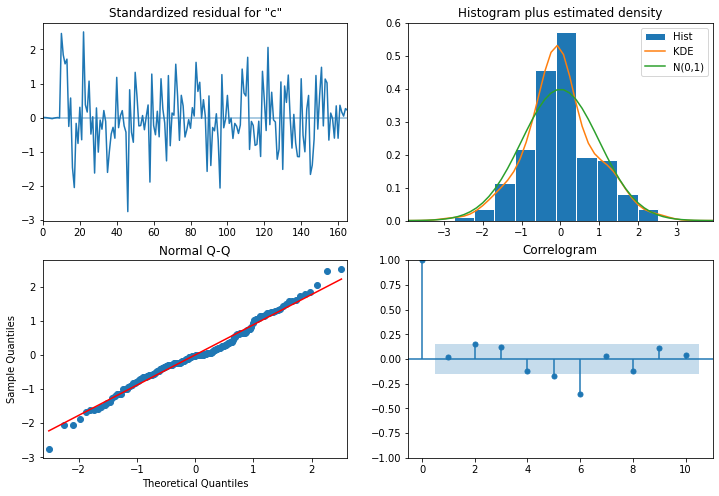

In [58]:
plot = results.plot_diagnostics()

In [59]:
# Prediction of the future

# Create SARIMA mean forecast
forecast = results.get_forecast(steps=30)
lower = forecast.conf_int()["lower count"]
upper = forecast.conf_int()["upper count"]

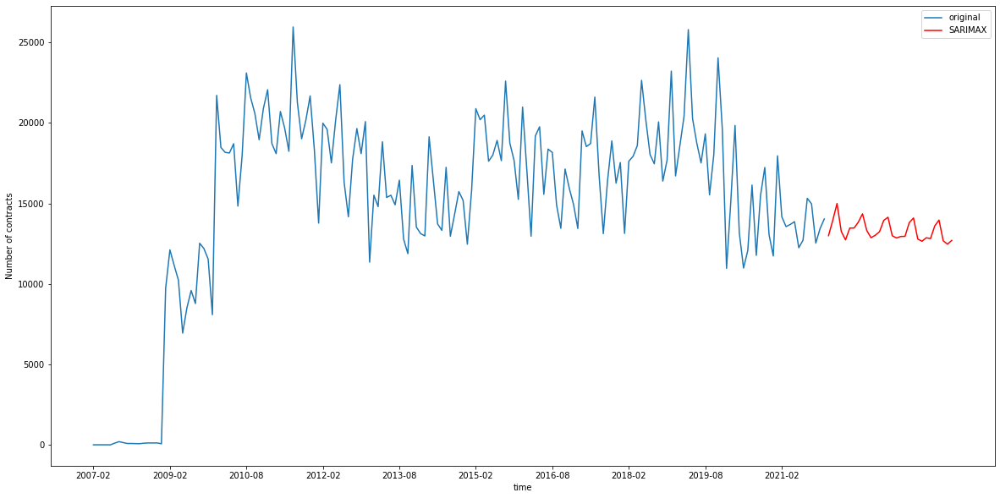

In [60]:
# Plot mean SARIMA predictions
fig,ax = plt.subplots(1,1,figsize=(20,10))

plt.plot(bal2, label='original')
plt.plot(forecast.predicted_mean, label='SARIMAX', c="r")

plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)

plt.xlabel('time')
plt.ylabel('Number of contracts')
plt.legend()
plt.show()

## Model Validation

In [61]:
# Featuring engineering
# Lag features and Shift index
for i in range(1,3):
    lag_i = 'lag_' + str(i)
    bal2[lag_i] = bal2['count'].shift(i)
    
# Rolling window
bal2['rolling_mean'] = bal2['count'].rolling(window=2).mean()
bal2['rolling_max'] = bal2['count'].rolling(window=2).max()
bal2['rolling_min'] = bal2['count'].rolling(window=2).min()

# Inference: count is less correlated with lag_1 and lag_2. Hence removing them from dataset.
bal2 = bal2[["rolling_mean","rolling_max", "rolling_min", "count"]]

# Fill NaN values with mean value
bal2.fillna(bal2.mean(), inplace = True)

# Split the time series data (Train-80, Test-20)
contract_train = bal2.iloc[0:138]               
contract_test = bal2.iloc[138:]

contract_pred_train = bal2.iloc[0:138]               
contract_pred_test = bal2.iloc[138:]

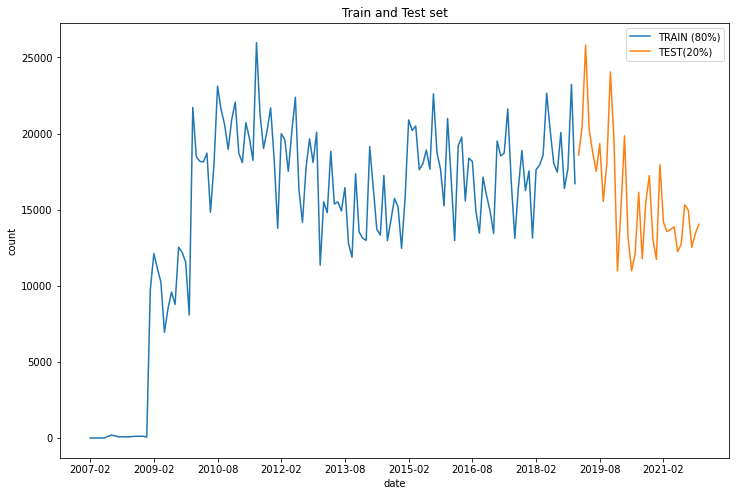

In [62]:
# Plot train and test sets
plt.plot(contract_train['count'],label='TRAIN (80%)')
plt.plot(contract_test['count'], label='TEST(20%)')
plt.legend(loc='best')
plt.xlabel('date')
plt.ylabel('count')
plt.title('Train and Test set')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

### Holt winter

In [63]:
# Modeling the simple exponential smoothing
ses_model = SimpleExpSmoothing(contract_train['count']).fit(smoothing_level=0.3)
ses_preds = ses_model.forecast(steps = 35) 

# Calculate the errors
ses_errors_df = contract_test[['count']]
ses_errors_df['Predicted_Count'] = ses_preds.values
ses_errors_df['Error'] = ses_preds.values - y_test
ses_errors_df.insert(0, 'Modelname', 'Holtman- SES')

# Modeling the double exponential smoothing
double_model = ExponentialSmoothing(contract_train['count'],trend='add').fit()
doublemodel_preds = double_model.forecast(35).rename('DES Forecast')

# Calculate the errors
des_errors_df = contract_test[['count']]
des_errors_df['Predicted_Count'] = doublemodel_preds.values
des_errors_df['Error'] = doublemodel_preds.values - y_test
des_errors_df.insert(0, 'Modelname', 'Holtman- DES')
des_errors_df.head() # da tenere?

# Modeling the triple exponential smoothing
triple_model = ExponentialSmoothing(contract_train['count'],trend='add', seasonal= 'mul',seasonal_periods= 12).fit(use_boxcox=False, remove_bias=False)
tes_forecast = triple_model.forecast(35).rename('TES_Forecast')

# Calculate the errors
tes_errors_df = contract_test[['count']]
tes_errors_df['Predicted_Count'] = tes_forecast.values
tes_errors_df['Error'] = tes_forecast.values - y_test
tes_errors_df.insert(0, 'Modelname', 'Holtman- TES')
tes_errors_df.head() # da tenere?

ValueError: Length of values (780405) does not match length of index (35)

NameError: name 'des_errors_df' is not defined

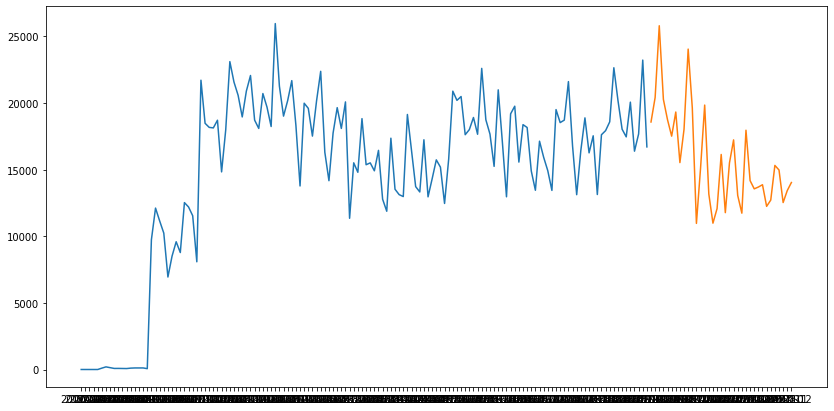

In [64]:
# Plot the number of contract using holtman forecast model using Double Exponential Smoothing
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(des_errors_df.index, des_errors_df['Predicted_Count'], label='Forecast - HW-DES')
plt.legend(loc='best')
plt.xlabel('date')
plt.ylabel('count')
plt.title('Forecast using Holt Winters-Double Exponential Smoothing')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

NameError: name 'tes_errors_df' is not defined

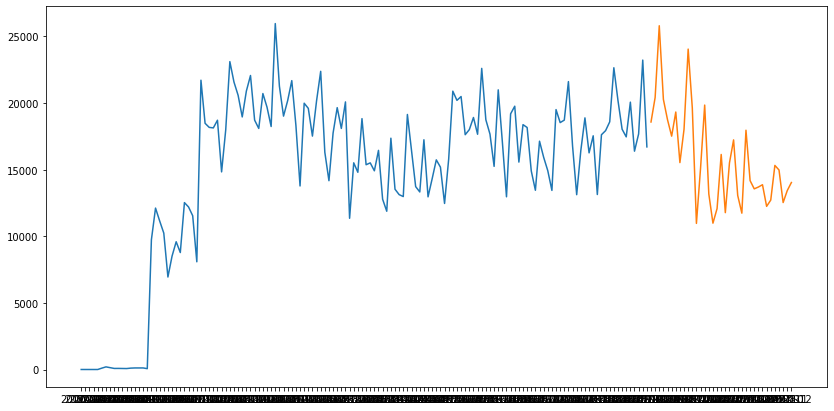

In [67]:
# Plot the number of contract using holtman forecast model using Triple Exponential Smoothing
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(tes_errors_df.index, tes_errors_df['Predicted_Count'], label='Forecast - HW-TES')
plt.legend(loc='best')
plt.xlabel('date')
plt.ylabel('count')
plt.title('Forecast using Holt Winters-Triple Exponential Smoothing')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

### Extra trees regressor

In [68]:
# Fit model
etr_model = ExtraTreesRegressor(n_estimators=100)
etr_model.fit(X_train, y_train)

# Start the prediction
etr_preds = etr_model.predict(X_test)

In [69]:
# Check the score for the train and test sets
print('Model Score at Train set: {:.2%}'.format(etr_model.score(X_train, y_train)))
print('Model Score at Test set: {:.2%}'.format(etr_model.score(X_test, y_test)))

Model Score at Train set: 17.63%
Model Score at Test set: 6.82%


In [70]:
# Calculate the errors
etr_errors_df = contract_test[['count']]
etr_errors_df['Predicted_Count'] = etr_preds
etr_errors_df['Error'] = etr_preds - y_test
etr_errors_df.insert(0, 'Modelname', 'ExtreeTreesRegressor')
etr_errors_df.head() # da tenere?

ValueError: Length of values (780405) does not match length of index (35)

KeyError: 'Predicted_Count'

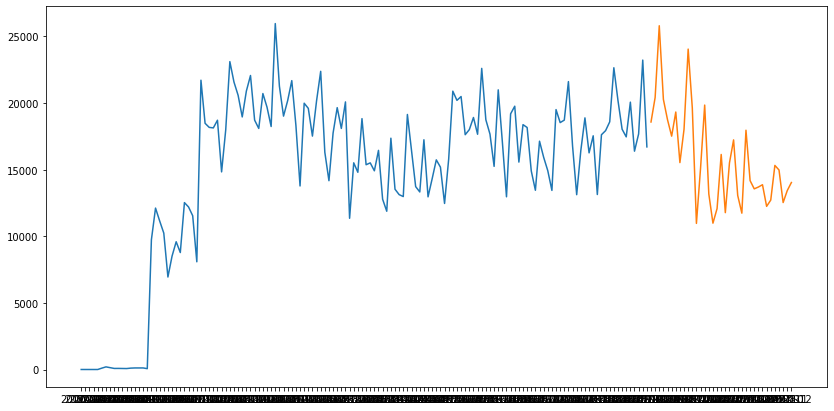

In [71]:
# Show the predictions for Extra Tree Regressor
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(etr_errors_df.index, etr_errors_df['Predicted_Count'], label='Forecast - ExtraTreesRegressor')
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('count')
plt.title('Forecast using ExtraTreesRegressor model')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

### Linear regression

In [72]:
# Fit model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Start the prediction
lr_preds = lr_model.predict(X_test)

# Calculate the errors
lr_errors_df = contract_test[['count']]
lr_errors_df['Predicted_Count'] = lr_preds
lr_errors_df['Error'] = lr_preds - y_test
lr_errors_df.insert(0, 'Modelname', 'Linear Regression')
lr_errors_df.head() # da tenere

ValueError: Length of values (780405) does not match length of index (35)

KeyError: 'Predicted_Count'

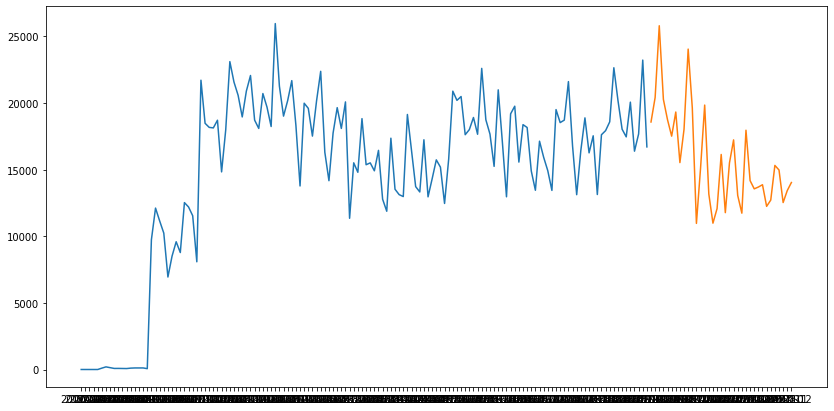

In [73]:
# Show the predictions for Linear Regression
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(lr_errors_df.index, lr_errors_df['Predicted_Count'], label='Forecast - Linear Regression')
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('count')
plt.title('Forecast using Linear Regression')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

### ARIMA e SARIMAX

In [74]:
# Fit the model
arima_model = ARIMA(bal2['count'], (3,1,3)).fit(disp=False)
print(arima_model.summary()) # da tenere ?

# Fit the model
sarima_model = SARIMAX(bal2['count'], order=(3, 1, 3), seasonal_order=(6, 1, 0, 6), 
                       enforce_invertibility=False, enforce_stationarity=False)
sarima_fit = sarima_model.fit()
sarima_test_df = contract_test[["count"]]
sarima_test_df['Predicted_Count'] = sarima_fit.predict(start=contract_test.index[0],
                                                 end=contract_test.index[-1], dynamic= True)
plot = sarima_fit.plot_diagnostics(figsize=(14,7))

NotImplementedError: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been removed in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and statsmodels.tsa.SARIMAX.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained. It also offers alternative specialized
parameter estimators.


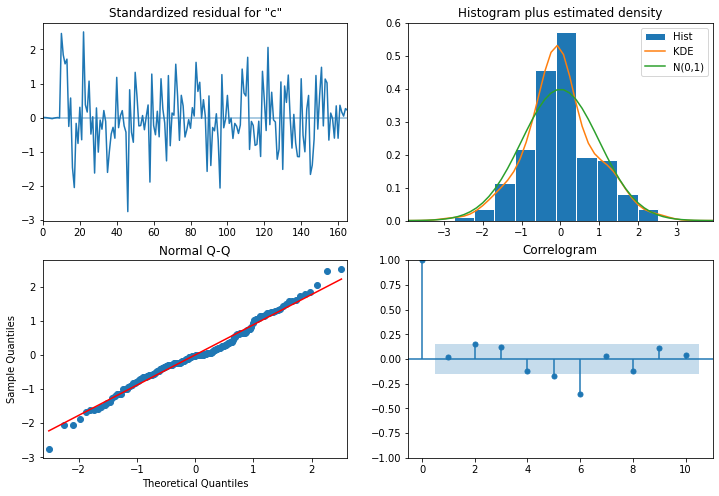

In [75]:
plot

In [76]:
# Evaluation of errors
sarima_test_df['Error'] = sarima_test_df['count'] - sarima_test_df.Predicted_Count
sarima_test_df.insert(0, 'Modelname', 'SARIMA')
sarima_test_df.head() # da tenere?

NameError: name 'sarima_test_df' is not defined

NameError: name 'sarima_test_df' is not defined

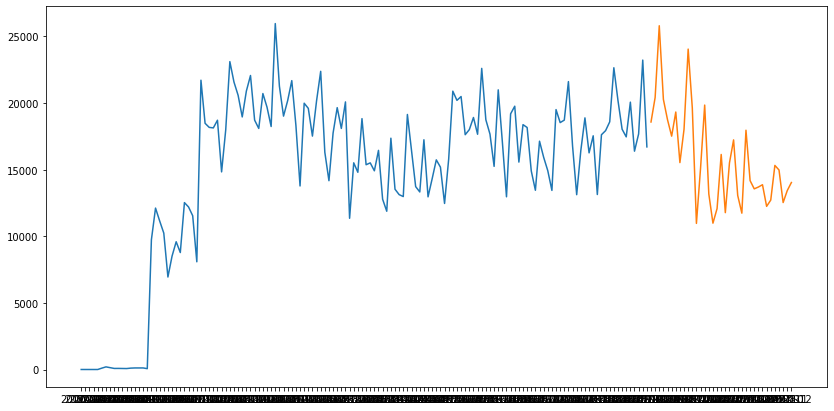

In [77]:
# Show the predictions for SARIMA model
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(sarima_test_df.index, sarima_test_df['Predicted_Count'], label='Forecast - SARIMA')
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('count')
plt.title('Forecast using SARIMA')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

In [78]:
# Show the errors for the predicted and the actual values
plt.figure(figsize=(14,7))
plt.plot(sarima_test_df.index, np.abs(sarima_test_df['Error']), label='errors')
plt.plot(sarima_test_df.index, sarima_test_df['count'], label='Actual Count')
plt.plot(sarima_test_df.index, sarima_test_df['Predicted_Count'], label='Predicted Count')
plt.legend(loc='best')
plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Seasonal ARIMA (SARIMA) forecasts with actual count vs errors')
plt.xticks(sarima_test_df.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

NameError: name 'sarima_test_df' is not defined

<Figure size 1008x504 with 0 Axes>

### SVR (Support Vector Regressor) regressor

In [ ]:
# Start the prediction
import sklearn
svr_model = sklearn.svm.SVR(kernel='linear', degree=3, C=1.0,).fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)

# Errors calculation
svr_errors_df = contract_test[['count']]
svr_errors_df['Predicted_Count'] = svr_preds
svr_errors_df['Error'] = svr_preds - y_test
svr_errors_df.insert(0, 'Modelname', 'Support Vector Regressor')
svr_errors_df.head() # da tenere?

In [ ]:
# Show predictions for Support Vector Regressor
fig = plt.figure(figsize=(14,7))
plt.plot(contract_train.index, contract_train['count'], label='Train')
plt.plot(contract_test.index, contract_test['count'], label='Test')
plt.plot(svr_errors_df.index, svr_errors_df['Predicted_Count'], label='Forecast - Support Vector Regressor')
plt.legend(loc='best')
plt.xlabel('Intervals')
plt.ylabel('Count')
plt.title('Forecast using Support Vector Regressor')
plt.xticks(bal2.index.unique())
plt.locator_params(axis='x', nbins=10)
plt.show()

## Compare the different models

In [79]:
# Define metrics

def mae(err):
    return np.mean(np.abs(err))

def rmse(err):
    return np.sqrt(np.mean(err ** 2))

def mape(err, count=tes_errors_df['count']):
    return np.sum(np.abs(err))/np.sum(count) * 100

NameError: name 'tes_errors_df' is not defined

In [80]:
# Calculate metrics for SVR
result_df_svr = svr_errors_df.groupby('Modelname').agg(Total_Count=('count', 'sum'),
                                          Total_Pred_Count=('Predicted_Count', 'sum'),
                                          Model_Overall_Error=('Error', 'sum'),
                                          MAE=('Error', mae),
                                          RMSE=('Error', rmse), 
                                          MAPE=('Error', mape))
result_df_svr # da tenere?

# Calculate metrics for SARIMA
result_df_sarima = sarima_test_df.groupby('Modelname').agg(Total_Count=('count', 'sum'),
                                          Total_Pred_Count=('Predicted_Count', 'sum'),
                                          Model_Overall_Error=('Error', 'sum'),
                                          MAE=('Error', mae),
                                          RMSE=('Error', rmse), 
                                          MAPE=('Error', mape))
result_df_sarima # da tenere?

# Calculate metrics for Holtman Winter
result_df_hw = tes_errors_df.groupby('Modelname').agg(Total_Count=('count', 'sum'),
                                          Total_Pred_Count=('Predicted_Count', 'sum'),
                                          Model_Overall_Error=('Error', 'sum'),
                                          MAE=('Error', mae),
                                          RMSE=('Error', rmse), 
                                          MAPE=('Error', mape))
result_df_hw # da tenere?

# Calculate metrics for Linear regression
result_df_lr = lr_errors_df.groupby('Modelname').agg(Total_Count=('count', 'sum'),
                                          Total_Pred_Count=('Predicted_Count', 'sum'),
                                          Model_Overall_Error=('Error', 'sum'),
                                          MAE=('Error', mae),
                                          RMSE=('Error', rmse), 
                                          MAPE=('Error', mape))
result_df_lr # da tenere?

# Calculate metrics for Extra tree regression
result_df_etr = etr_errors_df.groupby('Modelname').agg(Total_Count=('count', 'sum'),
                                          Total_Pred_Count=('Predicted_Count', 'sum'),
                                          Model_Overall_Error=('Error', 'sum'),
                                          MAE=('Error', mae),
                                          RMSE=('Error', rmse), 
                                          MAPE=('Error', mape))
result_df_etr # da tenere?

# Create the table with all the previous calculated results
list_objs = [result_df_svr, result_df_lr, result_df_hw, result_df_sarima, result_df_etr]
metrics_table = pd.concat(list_objs)
metrics_table # da tenere?

# Check of the model
print('Model Score at Train set: {:.2%}'.format(etr_model.score(X_train, y_train))) # da tenere?
print('Model Score at Test set: {:.2%}'.format(etr_model.score(X_test, y_test))) # da tenere?

# Show Prediction of Extra Tree Regressor
etr_prediction = pd.DataFrame(data=etr_preds, columns=['Predicted_Count'])
contract_pred_test.drop(columns= ['rolling_mean','rolling_max','rolling_min'], inplace=True)
contract_pred_test.reset_index(inplace=True)
compare_results = pd.merge(contract_pred_test, etr_prediction, left_index=True, right_index=True)
# Compare the predictions with the real values
compare_results=compare_results.drop(columns='mese-anno')

NameError: name 'svr_errors_df' is not defined

In [81]:
compare_results

NameError: name 'compare_results' is not defined

# Pre COVID Prediction

In [82]:
# Extract only the elements of the pre COVID years
pre_covid = transformed[transformed['ANNO']<2019]

# Execute the undersampling for the NON INDETERMINATO's contracts
data_0 = pre_covid[pre_covid["contratto_transformed"]==0].sample(n=356141,random_state=16)
data_1 = pre_covid[pre_covid["contratto_transformed"]==1]
balanced_pre = data_0.append(data_1)

# Create the train and test sets
X = balanced_pre[["ETA","ANNO","contratto_transformed","nazionalita_transformed","genere_transformed"]].values
y = pd.DataFrame(balanced_pre['Codice_ateco'].copy()).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 7)

# To avoid the MemoryError, we change the dataset's type into a new lighter one
X_train=X_train.astype(np.uint8)
y_train=y_train.astype(np.uint8)


## Decision Tree

In [ ]:
# Define the Decision Tree
dct = tree.DecisionTreeClassifier()
DecisionTreeClassifier(criterion='entropy', splitter='best', max_depth=10,
                           min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
                           max_features=None, 
                           random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, 
                           class_weight=None)

# Create Decision tree and fit it
dct.fit(X_train, y_train)


In [ ]:
plt.figure(figsize=(4,4), dpi=1000)
plot_tree(dct,
         feature_names=["ETA","ANNO","contratto_transformed","nazionalita_transformed","genere_transformed"],
          filled=True,)

# Show Decision tree
plt.show()

In [ ]:
# Probablistic prediction the values
y_pred_prob = dct.predict_proba(X_test)
y_pred_prob

In [ ]:
# Predict the values
y_pred = dct.predict(X_test)
y_pred

In [ ]:
# To avoid the MemoryError, we change the dataset's type into a new lighter one
y_test=y_test.astype(np.uint8)
y_pred=y_pred.astype(np.uint8)

In [ ]:
# Print the confusion matrix
confusion = metrics.confusion_matrix(y_test, y_pred)
print(confusion)

In [ ]:
from sklearn import preprocessing
normalized = preprocessing.normalize(confusion)

In [ ]:
fig=px.imshow(normalized,color_continuous_scale='blues')
fig.show()

## ARIMA

In [83]:
# Load the dataset
balanced1 = balanced_pre.copy()
balanced1 = balanced1.reset_index(drop=True)

# Set mese-anno like index
# Show count of contract for each mese-anno
balanced2 = balanced1.groupby("mese-anno").size().reset_index(name='count')
balanced2 = balanced2.set_index('mese-anno')

Text(0, 0.5, 'Number of Contracts')

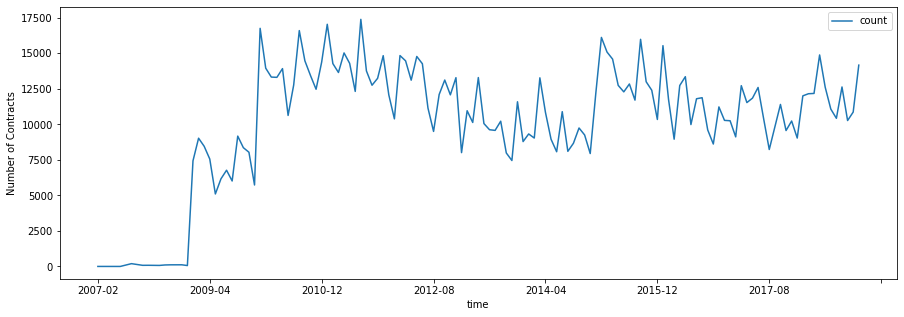

In [84]:
f, ax1 = plt.subplots(1,1,figsize=(15,5))
balanced2.plot(ax=ax1)
ax1.set_xlabel("time")
ax1.set_ylabel("Number of Contracts")

In [85]:
# Calculate the Augmented Dickey-Fuller test can be used to test for a unit root in a univariate 
#process in the presence of serial correlation.
results = adfuller(balanced2['count'])
print('ADF Statistic: %f' % results[0]) # da tenere?
print('p-value: %f' % results[1]) # da tenere?

# Show seasonality and trend
plt.rcParams['figure.figsize'] = 20, 10
# Additive decomposition
decomposed_add = seasonal_decompose(balanced2, model="additive", period=5)

ADF Statistic: -3.504387
p-value: 0.007875


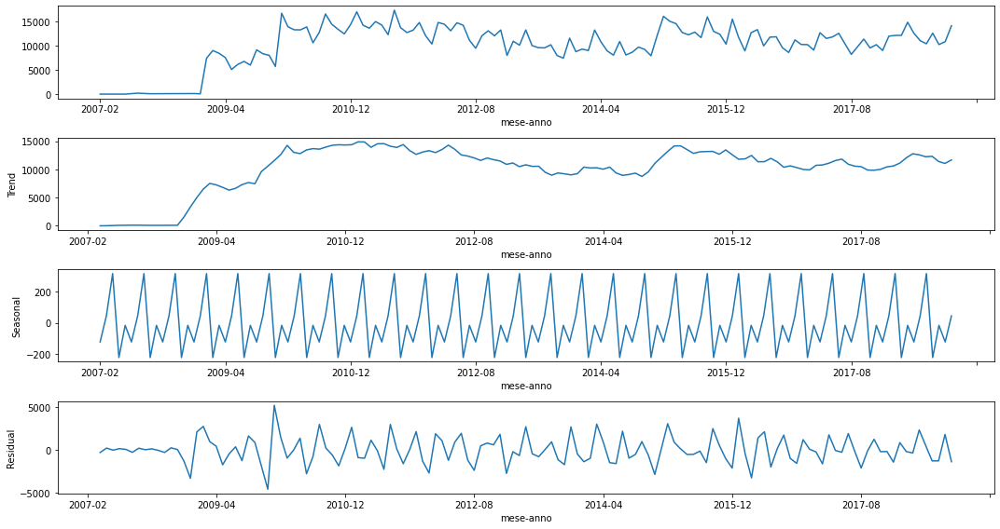

In [86]:
fig, ax = plt.subplots(4, 1, figsize=(15, 8))
# Plot the series
decomposed_add.observed.plot(ax = ax[0])
decomposed_add.trend.plot(ax = ax[1])
decomposed_add.seasonal.plot(ax = ax[2])
decomposed_add.resid.plot(ax = ax[3])
# Add the labels to the Y-axis
ax[0].set_ylabel('')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

plt.tight_layout()
plt.show()

In [87]:
# Search p and q values

arima_df = pd.DataFrame(columns=["p","q","aic","bic"])

i=0
# Loop over p values from 0-5
for p in range(4):
    # Loop over q values from 0-5
    for q in range(4):
        
        try:
            # creating and fitting ARIMA(p,1,q) model
            model = ARIMA(balanced2['count'].astype(float), order=(p,1,q))
            results = model.fit()
            
            # Printing order, AIC and BIC
            #print(p, q, results.aic, results.bic)
            arima_df.loc[i,"p"] = p
            arima_df.loc[i,"q"] = q
            arima_df.loc[i,"aic"] = results.aic
            arima_df.loc[i,"bic"] = results.bic
            i = i+1
        except:
            #print(p, q, None, None)
            i = i+1
    
arima_df["sum_aic_bic"] = arima_df["aic"]+arima_df["bic"]
arima_df.sort_values(by="aic", ascending=False, inplace=True)

In [88]:
arima_df

,p,q,aic,bic,sum_aic_bic


In [89]:
# Compute the model
model2 = SARIMAX(balanced2, order=(3,1,3), seasonal_order=(0,1,0,6))
results = model2.fit()
print(results.summary()) # da tenere?

# Show the parameters
plt.rcParams['figure.figsize'] = 12, 8

                                     SARIMAX Results                                      
Dep. Variable:                              count   No. Observations:                  137
Model:             SARIMAX(3, 1, 3)x(0, 1, [], 6)   Log Likelihood               -1206.753
Date:                            Thu, 26 May 2022   AIC                           2427.507
Time:                                    16:17:17   BIC                           2447.580
Sample:                                         0   HQIC                          2435.663
                                            - 137                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5008      0.152     -3.303      0.001      -0.798      -0.204
ar.L2         -0.6657      0.148   

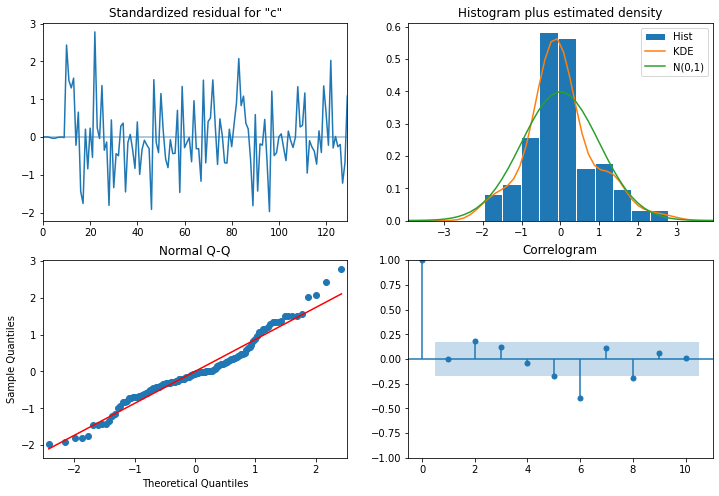

In [90]:
plot = results.plot_diagnostics()

In [91]:
# Prediction of the future

# Create SARIMA mean forecast
forecast = results.get_forecast(steps=30)
lower = forecast.conf_int()["lower count"]
upper = forecast.conf_int()["upper count"]

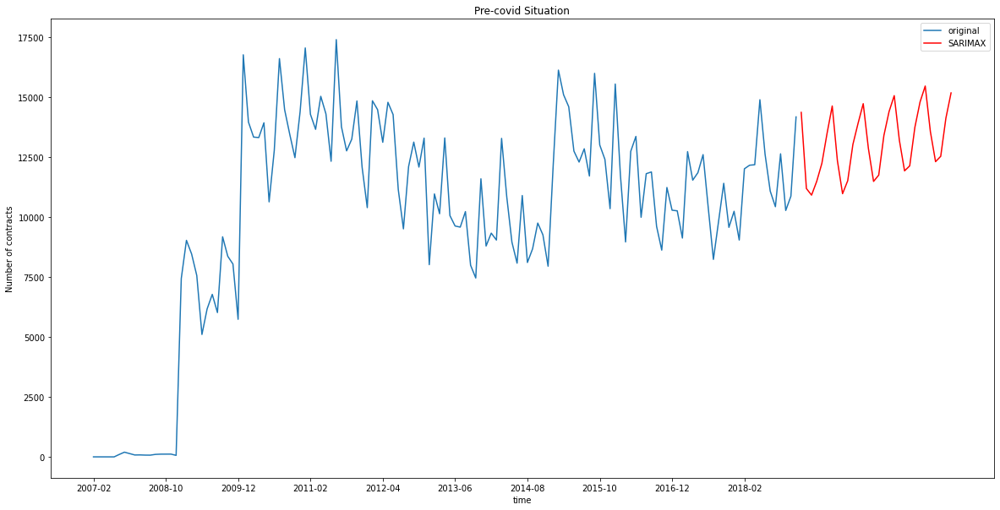

In [92]:
# Plot mean SARIMA predictions
fig,ax = plt.subplots(1,1,figsize=(20,10))

plt.plot(balanced2, label='original')
plt.plot(forecast.predicted_mean, label='SARIMAX', c="r")

plt.xticks(balanced2.index.unique())
plt.locator_params(axis='x', nbins=10)

plt.xlabel('time')
plt.ylabel('Number of contracts')
plt.title('Pre-covid Situation')
plt.legend()
plt.show()

### Pre vs Post COVID

In [93]:
# Extract only the elements of the post COVID years
post_covid = transformed[transformed['ANNO']>=2019]

# Execute the undersampling for the NON INDETERMINATO's contracts
data_0 = post_covid[post_covid["contratto_transformed"]==0].sample(n=99709,random_state=16) 
data_1 = post_covid[post_covid["contratto_transformed"]==1]
balanced_covid = data_0.append(data_1)

# Set mese-anno like index
# Show count of contract for each mese-anno
balanced_covid1 = balanced_covid.groupby("mese-anno").size().reset_index(name='count')
balanced_covid1 = balanced_covid1.set_index('mese-anno')

Text(0, 0.5, 'Number of Contracts')

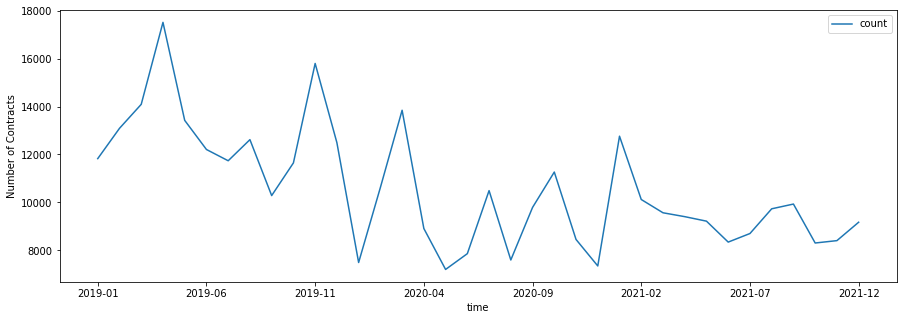

In [94]:
f, ax1 = plt.subplots(1,1,figsize=(15,5))
balanced_covid1.plot(ax=ax1)
ax1.set_xlabel("time")
ax1.set_ylabel("Number of Contracts")

In [95]:
# Create SARIMA mean forecast
forecast = results.get_forecast(steps=30)
lower = forecast.conf_int()["lower count"]
upper = forecast.conf_int()["upper count"]

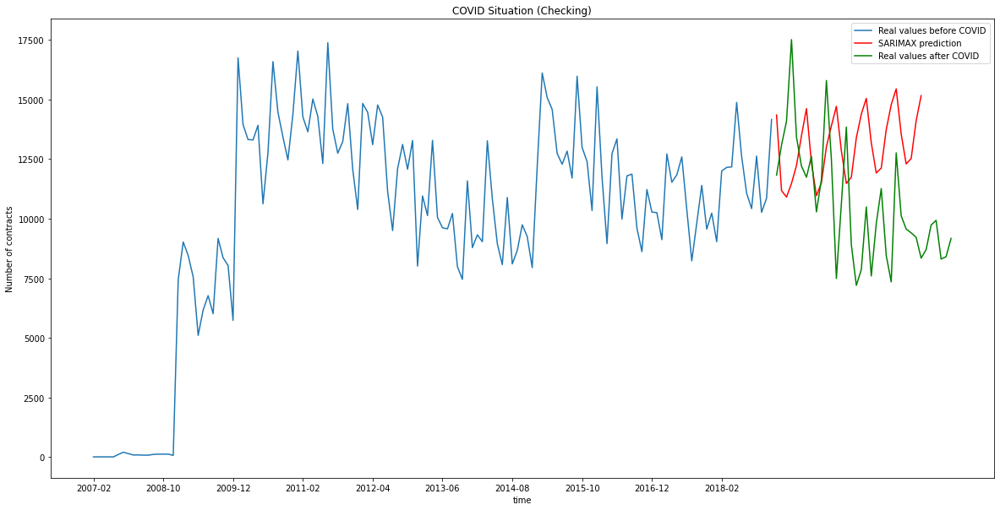

In [96]:
# Plot mean SARIMA predictions
fig,ax = plt.subplots(1,1,figsize=(20,10))

plt.plot(balanced2, label='Real values before COVID')
plt.plot(forecast.predicted_mean, label='SARIMAX prediction', c="r")
plt.plot(balanced_covid1, label='Real values after COVID', c='g')
plt.xticks(balanced2.index.unique())
plt.locator_params(axis='x', nbins=10)

plt.xlabel('time')
plt.ylabel('Number of contracts')
plt.title('COVID Situation (Checking)')
plt.legend()
plt.show()

# Results